In [ ]:
# !pip install kaggle

In [ ]:
# !mkdir ~/.kaggle
# !mv kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json

mv: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
# !kaggle datasets download -d clmentbisaillon/fake-and-real-news-dataset


Dataset URL: https://www.kaggle.com/datasets/clmentbisaillon/fake-and-real-news-dataset
License(s): CC-BY-NC-SA-4.0
 95% 39.0M/41.0M [00:02<00:00, 20.5MB/s]
100% 41.0M/41.0M [00:02<00:00, 14.9MB/s]


In [ ]:
# !unzip fake-and-real-news-dataset.zip


Archive:  fake-and-real-news-dataset.zip
  inflating: Fake.csv                
  inflating: True.csv                


In [ ]:
!pip install pyspark

In [ ]:
!pip install graphframes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 3.8 MB/s eta 0:00:00


In [ ]:
from pyspark.sql.functions import lit

In [ ]:
from pyspark.sql import SparkSession

# Initialize Spark Session
spark = SparkSession.builder.appName("FakeNewsClassification").getOrCreate()

# Load CSV files into PySpark DataFrames
real_news_df = spark.read.csv("/content/True.csv", header=True, inferSchema=True)
fake_news_df = spark.read.csv("/content/Fake.csv", header=True, inferSchema=True)

# Add a Label Column (1 = Real, 0 = Fake)
real_news_df = real_news_df.withColumn("label", lit(1))
fake_news_df = fake_news_df.withColumn("label", lit(0))

# Combine both datasets
news_df = real_news_df.union(fake_news_df)

# Show the schema and data
news_df.printSchema()
news_df.show(5)


root
 |-- title: string (nullable = true)
 |-- text: string (nullable = true)
 |-- subject: string (nullable = true)
 |-- date: string (nullable = true)
 |-- label: integer (nullable = false)

+--------------------+--------------------+------------+------------------+-----+
|               title|                text|     subject|              date|label|
+--------------------+--------------------+------------+------------------+-----+
|As U.S. budget fi...|WASHINGTON (Reute...|politicsNews|December 31, 2017 |    1|
|U.S. military to ...|WASHINGTON (Reute...|politicsNews|December 29, 2017 |    1|
|Senior U.S. Repub...|WASHINGTON (Reute...|politicsNews|December 31, 2017 |    1|
|FBI Russia probe ...|WASHINGTON (Reute...|politicsNews|December 30, 2017 |    1|
|Trump wants Posta...|SEATTLE/WASHINGTO...|politicsNews|December 29, 2017 |    1|
+--------------------+--------------------+------------+------------------+-----+
only showing top 5 rows



In [ ]:
#Step 2: Handle Missing Values


# Check for missing values
from pyspark.sql.functions import col

news_df.select([col(c).isNull().alias(c) for c in news_df.columns]).show()

# Drop rows with critical missing values (like missing text or title)
news_df = news_df.na.drop(subset=["text", "title"])


+-----+-----+-------+-----+-----+
|title| text|subject| date|label|
+-----+-----+-------+-----+-----+
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
|false|false|  false|false|false|
+-----+-----+-------+-----+-----+
only showing top 20 rows



In [ ]:
#Step 3: Text Cleaning
from pyspark.sql.functions import regexp_replace, lower

# Clean the text column
news_df = news_df.withColumn("cleaned_text", lower(col("text")))
news_df = news_df.withColumn("cleaned_text", regexp_replace(col("cleaned_text"), "[^a-zA-Z\s]", ""))


In [ ]:
from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer, IDF

# Tokenization
tokenizer = Tokenizer(inputCol="cleaned_text", outputCol="words")
news_df = tokenizer.transform(news_df)

# Remove Stop Words
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
news_df = remover.transform(news_df)

# Vectorization (TF-IDF)
count_vectorizer = CountVectorizer(inputCol="filtered_words", outputCol="raw_features")
vectorized_model = count_vectorizer.fit(news_df)
news_df = vectorized_model.transform(news_df)

idf = IDF(inputCol="raw_features", outputCol="features")
idf_model = idf.fit(news_df)
news_df = idf_model.transform(news_df)

# View processed data
news_df.select("features", "label").show(5)


+--------------------+-----+
|            features|label|
+--------------------+-----+
|(207968,[0,1,2,3,...|    1|
|(207968,[0,1,2,3,...|    1|
|(207968,[0,1,2,3,...|    1|
|(207968,[0,1,2,3,...|    1|
|(207968,[0,1,2,3,...|    1|
+--------------------+-----+
only showing top 5 rows



+-----+-----+
|label|count|
+-----+-----+
|    1|21417|
|    0|23481|
+-----+-----+



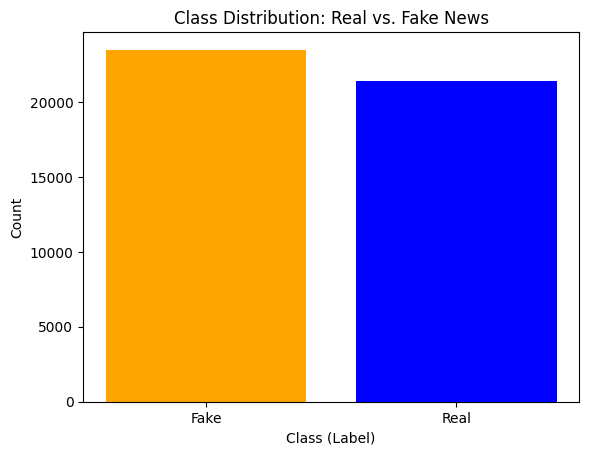

In [ ]:
#Step 1: Class Distribution
# Count the number of records for each label
class_distribution = news_df.groupBy("label").count()
class_distribution.show()

# Plot the class distribution
import matplotlib.pyplot as plt

class_dist_pd = class_distribution.toPandas()
plt.bar(class_dist_pd['label'], class_dist_pd['count'], color=['blue', 'orange'])
plt.xlabel("Class (Label)")
plt.ylabel("Count")
plt.title("Class Distribution: Real vs. Fake News")
plt.xticks([0, 1], ["Fake", "Real"])
plt.show()


+-----+------------------+
|label|        avg_length|
+-----+------------------+
|    1| 2372.866507914274|
|    0|2476.0307482645544|
+-----+------------------+



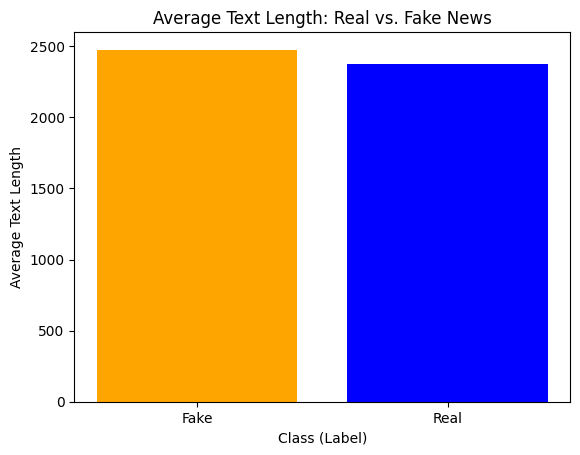

In [ ]:
#Step 2: Text Length Analysis
from pyspark.sql.functions import length, col

# Add a text length column
news_df = news_df.withColumn("text_length", length(col("text")))

# Calculate average text length per class
avg_text_length = news_df.groupBy("label").avg("text_length").withColumnRenamed("avg(text_length)", "avg_length")
avg_text_length.show()

# Plot average text length
avg_text_length_pd = avg_text_length.toPandas()
plt.bar(avg_text_length_pd['label'], avg_text_length_pd['avg_length'], color=['blue', 'orange'])
plt.xlabel("Class (Label)")
plt.ylabel("Average Text Length")
plt.title("Average Text Length: Real vs. Fake News")
plt.xticks([0, 1], ["Fake", "Real"])
plt.show()


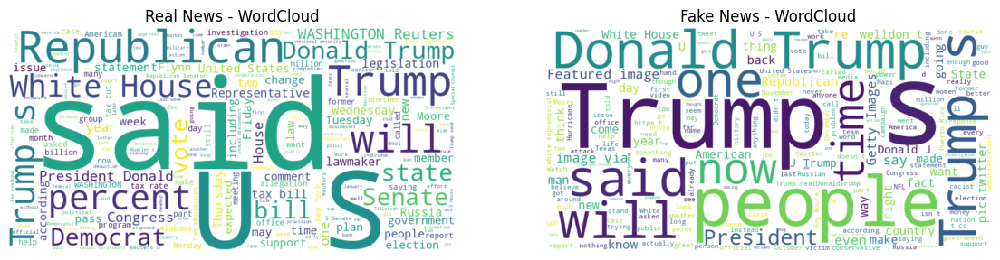

In [ ]:
#Step 3: Most Frequent Words
!pip install wordcloud
from wordcloud import WordCloud

# Generate WordCloud for Real News
real_text = " ".join(row["text"] for row in news_df.filter(col("label") == 1).select("text").limit(500).collect())
real_wordcloud = WordCloud(width=800, height=400, background_color="white").generate(real_text)

# Generate WordCloud for Fake News
fake_text = " ".join(row["text"] for row in news_df.filter(col("label") == 0).select("text").limit(500).collect())
fake_wordcloud = WordCloud(width=800, height=400, background_color="white").generate(fake_text)

# Plot WordClouds
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(real_wordcloud, interpolation="bilinear")
plt.title("Real News - WordCloud")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(fake_wordcloud, interpolation="bilinear")
plt.title("Fake News - WordCloud")
plt.axis("off")
plt.show()


In [ ]:
#Step 4: Subject Analysis
# Count subjects for each label
subject_dist = news_df.groupBy("subject", "label").count()
subject_dist.show()

# Convert to Pandas for plotting
subject_dist_pd = subject_dist.toPandas()

# Plot subject distribution
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.barplot(data=subject_dist_pd, x="subject", y="count", hue="label", palette=["orange", "blue"])
plt.xlabel("Subject")
plt.ylabel("Count")
plt.title("Subject Distribution by Label")
plt.xticks(rotation=45)
plt.legend(title="Label", labels=["Fake", "Real"])
plt.show()


+--------------------+-----+-----+
|             subject|label|count|
+--------------------+-----+-----+
|       nor will help|    1|    1|
| Management and E...|    1|    1|
|        politicsNews|    1|11209|
|      if implemented|    1|    1|
| the first obstac...|    1|    1|
| Associates Up 83...|    1|    1|
|"" a process in w...|    1|    1|
| one of the lobby...|    1|    1|
| touched a one-mo...|    1|    1|
| but it will hurt...|    1|    1|
|        000 new jobs|    1|    1|
| "" said Tom Vilsack|    1|    1|
|"" shows Clinton ...|    1|    1|
| this is not a bl...|    1|    1|
| baffled or amuse...|    1|    1|
| and the Tamil Ti...|    1|    1|
|"" and has said h...|    1|    1|
|"" Mnuchin told t...|    1|    1|
| while people in ...|    1|    1|
|          in my view|    1|    1|
+--------------------+-----+-----+
only showing top 20 rows



In [ ]:
#Step 1: Train-Test Split
# Split the data into training and test sets (80/20 split)
train_data, test_data = news_df.randomSplit([0.8, 0.2], seed=42)


In [ ]:
#Step 2: Model Training
from pyspark.ml.classification import LogisticRegression

# Initialize Logistic Regression model
lr = LogisticRegression(featuresCol="features", labelCol="label")

# Train the model
lr_model = lr.fit(train_data)

# Make predictions on the test data
lr_predictions = lr_model.transform(test_data)

# View the predictions
lr_predictions.select("label", "prediction", "probability").show(5)


+-----+----------+--------------------+
|label|prediction|         probability|
+-----+----------+--------------------+
|    1|       1.0|[2.53662924396015...|
|    1|       1.0|[4.91317001350209...|
|    1|       1.0|[1.88469182564274...|
|    1|       1.0|[7.52113289424771...|
|    1|       1.0|[2.73997902744328...|
+-----+----------+--------------------+
only showing top 5 rows



In [ ]:
lr_model

LogisticRegressionModel: uid=LogisticRegression_7ea625129d22, numClasses=2, numFeatures=207968

In [ ]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(lr_predictions)
print(f"Accuracy: {accuracy:.4f}")


Accuracy: 0.9791


In [ ]:
# Class distribution check
news_df.groupBy("label").count().show()


+-----+-----+
|label|count|
+-----+-----+
|    1|21417|
|    0|23481|
+-----+-----+



In [ ]:
from pyspark.ml.classification import NaiveBayes

# Initialize Naive Bayes model
nb = NaiveBayes(featuresCol="features", labelCol="label", modelType="multinomial")

# Train the model
nb_model = nb.fit(train_data)

# Make predictions on the test data
nb_predictions = nb_model.transform(test_data)

# View the predictions
nb_predictions.select("label", "prediction", "probability").show(5)


+-----+----------+--------------------+
|label|prediction|         probability|
+-----+----------+--------------------+
|    1|       1.0|[1.14917315158792...|
|    1|       1.0|[1.63760662290917...|
|    1|       1.0|           [0.0,1.0]|
|    1|       1.0|[2.07251586234113...|
|    1|       1.0|[6.39481994920194...|
+-----+----------+--------------------+
only showing top 5 rows



In [ ]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluate accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(nb_predictions)
print(f"Accuracy: {accuracy:.4f}")


Accuracy: 0.9649


In [ ]:
from pyspark.ml.classification import RandomForestClassifier

# Initialize Random Forest model
rf = RandomForestClassifier(featuresCol="features", labelCol="label", numTrees=50)

# Train the model
rf_model = rf.fit(train_data)

# Make predictions on the test data
rf_predictions = rf_model.transform(test_data)

# View the predictions
rf_predictions.select("label", "prediction", "probability").show(5)


+-----+----------+--------------------+
|label|prediction|         probability|
+-----+----------+--------------------+
|    1|       1.0|[0.48923553703587...|
|    1|       0.0|[0.50290751046053...|
|    1|       1.0|[0.42451234333125...|
|    1|       0.0|[0.50658371818435...|
|    1|       1.0|[0.45500490079012...|
+-----+----------+--------------------+
only showing top 5 rows



In [ ]:
#Step 3: Model Evaluation
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Initialize evaluator
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")

# Evaluate Logistic Regression
lr_accuracy = evaluator.evaluate(lr_predictions)
print(f"Logistic Regression Accuracy: {lr_accuracy:.4f}")

# Evaluate Naive Bayes
nb_accuracy = evaluator.evaluate(nb_predictions)
print(f"Naive Bayes Accuracy: {nb_accuracy:.4f}")

# Evaluate Random Forest
rf_accuracy = evaluator.evaluate(rf_predictions)
print(f"Random Forest Accuracy: {rf_accuracy:.4f}")


Logistic Regression Accuracy: 0.9791
Naive Bayes Accuracy: 0.9649
Random Forest Accuracy: 0.9199


In [ ]:
# Initialize evaluator for weighted Precision, Recall, and F1-Score
precision_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="weightedPrecision")
recall_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="weightedRecall")
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")

# Evaluate Precision, Recall, and F1-Score for Logistic Regression
lr_precision = precision_evaluator.evaluate(lr_predictions)
lr_recall = recall_evaluator.evaluate(lr_predictions)
lr_f1 = f1_evaluator.evaluate(lr_predictions)

In [ ]:
#Step 4: Confusion Matrix and Additional Metrics
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Initialize evaluator for Precision, Recall, and F1-Score
precision_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="weightedPrecision")
recall_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="weightedRecall")
f1_evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")



nb_precision = precision_evaluator.evaluate(nb_predictions)
nb_recall = recall_evaluator.evaluate(nb_predictions)
nb_f1 = f1_evaluator.evaluate(nb_predictions)

rf_precision = precision_evaluator.evaluate(rf_predictions)
rf_recall = recall_evaluator.evaluate(rf_predictions)
rf_f1 = f1_evaluator.evaluate(rf_predictions)

print(f"Logistic Regression - Precision: {lr_precision:.4f}, Recall: {lr_recall:.4f}, F1-Score: {lr_f1:.4f}")
print(f"Naive Bayes - Precision: {nb_precision:.4f}, Recall: {nb_recall:.4f}, F1-Score: {nb_f1:.4f}")
print(f"Random Forest - Precision: {rf_precision:.4f}, Recall: {rf_recall:.4f}, F1-Score: {rf_f1:.4f}")


Logistic Regression - Precision: 0.9792, Recall: 0.9791, F1-Score: 0.9791
Naive Bayes - Precision: 0.9650, Recall: 0.9649, F1-Score: 0.9649
Random Forest - Precision: 0.9268, Recall: 0.9199, F1-Score: 0.9193


In [ ]:
#Step 5: Visualizing the Performance
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.classification import LogisticRegressionModel

# Evaluate the models' ROC curves
evaluator_roc = BinaryClassificationEvaluator(labelCol="label")

# Evaluate Logistic Regression ROC-AUC
lr_roc_auc = evaluator_roc.evaluate(lr_predictions)
print(f"Logistic Regression ROC-AUC: {lr_roc_auc:.4f}")

# Evaluate Naive Bayes ROC-AUC
nb_roc_auc = evaluator_roc.evaluate(nb_predictions)
print(f"Naive Bayes ROC-AUC: {nb_roc_auc:.4f}")

# Evaluate Random Forest ROC-AUC
rf_roc_auc = evaluator_roc.evaluate(rf_predictions)
print(f"Random Forest ROC-AUC: {rf_roc_auc:.4f}")


Logistic Regression ROC-AUC: 0.9944
Naive Bayes ROC-AUC: 0.5614
Random Forest ROC-AUC: 0.9908


In [ ]:
# Group by label and prediction to count instances
confusion_matrix = lr_predictions.groupBy("label", "prediction").count()
confusion_matrix.show()


+-----+----------+-----+
|label|prediction|count|
+-----+----------+-----+
|    1|       0.0|   64|
|    1|       1.0| 4105|
|    0|       0.0| 4524|
|    0|       1.0|  120|
+-----+----------+-----+



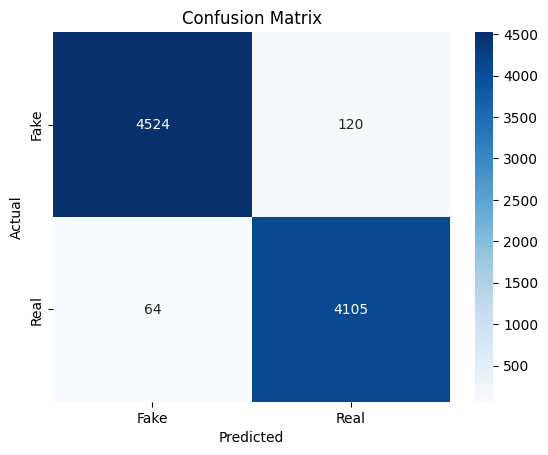

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Convert PySpark DataFrame to Pandas DataFrame for plotting
confusion_pd = confusion_matrix.toPandas()
pivot_table = confusion_pd.pivot(index="label", columns="prediction", values="count")

# Replace NaN values with 0 for visualization
pivot_table = pivot_table.fillna(0)

# Plot heatmap
sns.heatmap(pivot_table, annot=True, fmt="d", cmap="Blues", xticklabels=["Fake", "Real"], yticklabels=["Fake", "Real"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


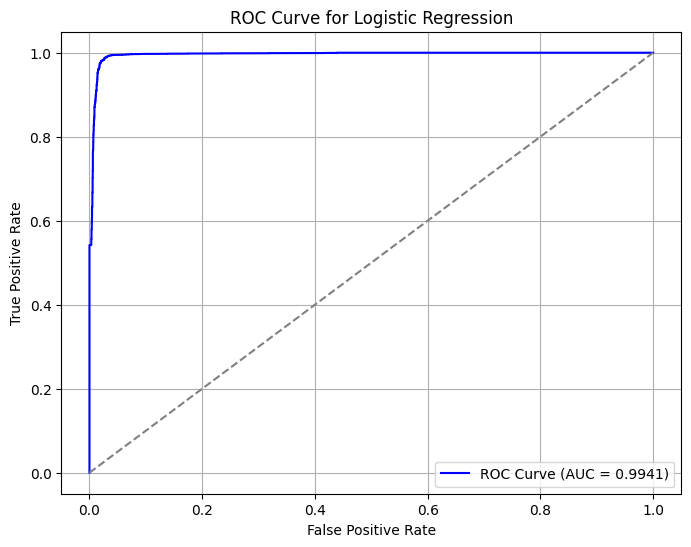

AUC-ROC: 0.9940598122932287


In [ ]:
from pyspark.ml.functions import vector_to_array
from pyspark.sql.functions import col
import matplotlib.pyplot as plt
from pyspark.mllib.evaluation import BinaryClassificationMetrics

# Convert the probability vector into an array
lr_predictions = lr_predictions.withColumn("probabilities", vector_to_array(col("probability")))

# Extract the probability for the positive class (index 1) and cast the label to float
predictions_and_labels = lr_predictions.select(
    col("probabilities")[1].alias("positive_probability"),  # Index 1 corresponds to the positive class
    col("label").cast("float").alias("label")
).rdd.map(lambda row: (row["positive_probability"], row["label"]))

# Initialize BinaryClassificationMetrics
metrics = BinaryClassificationMetrics(predictions_and_labels)

# Get AUC-ROC value
auc_roc = metrics.areaUnderROC

# Collect raw ROC points for plotting
roc_points = predictions_and_labels.collect()
roc_points = sorted(roc_points, key=lambda x: x[0], reverse=True)  # Sort by probability

# Compute FPR and TPR
tpr = []
fpr = []
positive_count = sum([1 for _, label in roc_points if label == 1])
negative_count = sum([1 for _, label in roc_points if label == 0])

tp = 0
fp = 0
for prob, label in roc_points:
    if label == 1:
        tp += 1
    else:
        fp += 1
    tpr.append(tp / positive_count if positive_count > 0 else 0)
    fpr.append(fp / negative_count if negative_count > 0 else 0)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc_roc:.4f})", color="blue")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")  # Random baseline
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Logistic Regression")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Print AUC-ROC value
print(f"AUC-ROC: {auc_roc}")


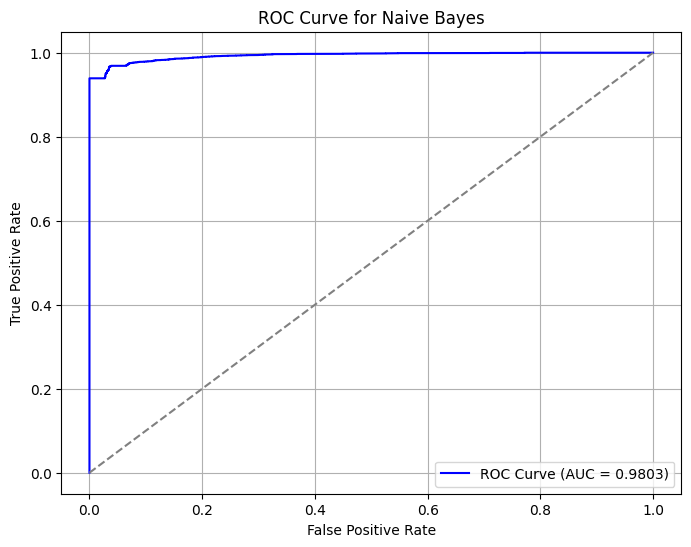

AUC-ROC: 0.9802658056707888


In [ ]:
from pyspark.ml.functions import vector_to_array
from pyspark.sql.functions import col
import matplotlib.pyplot as plt
from pyspark.mllib.evaluation import BinaryClassificationMetrics

# Convert the probability vector into an array
nb_predictions = nb_predictions.withColumn("probabilities", vector_to_array(col("probability")))

# Extract the probability for the positive class (index 1) and cast the label to float
predictions_and_labels = nb_predictions.select(
    col("probabilities")[1].alias("positive_probability"),  # Index 1 corresponds to the positive class
    col("label").cast("float").alias("label")
).rdd.map(lambda row: (row["positive_probability"], row["label"]))

# Initialize BinaryClassificationMetrics
metrics = BinaryClassificationMetrics(predictions_and_labels)

# Get AUC-ROC value
auc_roc = metrics.areaUnderROC

# Collect raw ROC points for plotting
roc_points = predictions_and_labels.collect()
roc_points = sorted(roc_points, key=lambda x: x[0], reverse=True)  # Sort by probability

# Compute FPR and TPR
tpr = []
fpr = []
positive_count = sum([1 for _, label in roc_points if label == 1])
negative_count = sum([1 for _, label in roc_points if label == 0])

tp = 0
fp = 0
for prob, label in roc_points:
    if label == 1:
        tp += 1
    else:
        fp += 1
    tpr.append(tp / positive_count if positive_count > 0 else 0)
    fpr.append(fp / negative_count if negative_count > 0 else 0)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc_roc:.4f})", color="blue")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")  # Random baseline
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Naive Bayes")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Print AUC-ROC value
print(f"AUC-ROC: {auc_roc}")


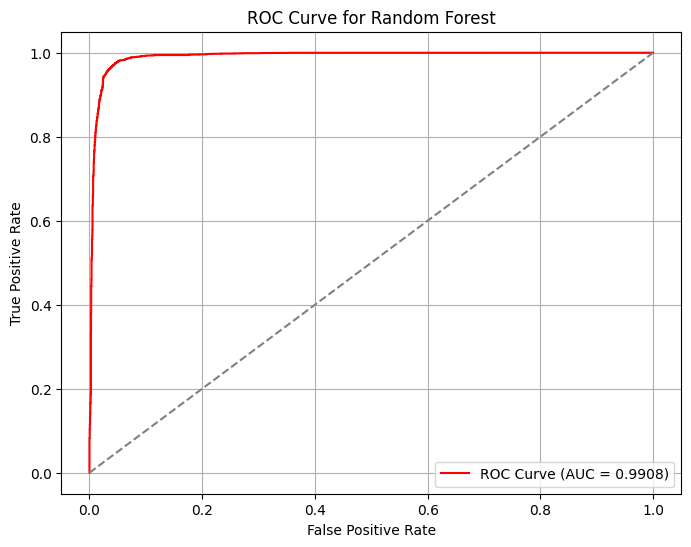

AUC-ROC: 0.9907887500312496


In [ ]:
from pyspark.ml.functions import vector_to_array
from pyspark.sql.functions import col
import matplotlib.pyplot as plt
from pyspark.mllib.evaluation import BinaryClassificationMetrics

# Convert the probability vector into an array
rf_predictions = rf_predictions.withColumn("probabilities", vector_to_array(col("probability")))

# Extract the probability for the positive class (index 1) and cast the label to float
predictions_and_labels = rf_predictions.select(
    col("probabilities")[1].alias("positive_probability"),  # Index 1 corresponds to the positive class
    col("label").cast("float").alias("label")
).rdd.map(lambda row: (row["positive_probability"], row["label"]))

# Initialize BinaryClassificationMetrics
metrics = BinaryClassificationMetrics(predictions_and_labels)

# Get AUC-ROC value
auc_roc = metrics.areaUnderROC

# Collect raw ROC points for plotting
roc_points = predictions_and_labels.collect()
roc_points = sorted(roc_points, key=lambda x: x[0], reverse=True)  # Sort by probability

# Compute FPR and TPR
tpr = []
fpr = []
positive_count = sum([1 for _, label in roc_points if label == 1])
negative_count = sum([1 for _, label in roc_points if label == 0])

tp = 0
fp = 0
for prob, label in roc_points:
    if label == 1:
        tp += 1
    else:
        fp += 1
    tpr.append(tp / positive_count if positive_count > 0 else 0)
    fpr.append(fp / negative_count if negative_count > 0 else 0)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc_roc:.4f})", color="red")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")  # Random baseline
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Random Forest")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Print AUC-ROC value
print(f"AUC-ROC: {auc_roc}")


In [ ]:
# Assuming 'rf_model' is your trained RandomForest model
import pandas as pd

# Get feature importances from the trained Random Forest model
feature_importances = rf_model.featureImportances

# Convert feature importances into a pandas DataFrame for easier interpretation
import numpy as np
feature_names = np.array([f"feature_{i}" for i in range(len(feature_importances))])  # Assuming feature names are like feature_0, feature_1, ...

# Create DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances.toArray()
})

# Sort the DataFrame by feature importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Display the feature importance
print(importance_df)

# # If you want to plot the feature importances:
# import matplotlib.pyplot as plt

# # Plot feature importances
# plt.figure(figsize=(10, 6))
# plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
# plt.xlabel('Feature Importance')
# plt.ylabel('Feature')
# plt.title('Feature Importance for Random Forest')
# plt.gca().invert_yaxis()  # Invert to show the most important features at the top
# plt.show()


               Feature  Importance
3            feature_3    0.023638
509        feature_509    0.022962
80          feature_80    0.021438
10          feature_10    0.019874
84          feature_84    0.016490
...                ...         ...
69837    feature_69837    0.000000
69838    feature_69838    0.000000
69839    feature_69839    0.000000
69840    feature_69840    0.000000
207967  feature_207967    0.000000

[207968 rows x 2 columns]
